# Partie A : Traitement

### Installation des Librairies

In [45]:
%pip install pandas
%pip install os
%pip install numpy
%pip install plotly
%pip install nbformat


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement os (from versions: none)
ERROR: No matching distribution found for os

[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


### Importation des librairies

In [46]:
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import nbformat
print(nbformat.__version__)

5.10.4


### Téléchargement de la base de donnée que nous allons exploiter

In [47]:
df1 = pd.read_csv('C:/Users/youmn/OneDrive/Bureau/FAC/Master 1/Formation/DataViz/dataframes projet/dataframe 1406_5/file.csv')
print(df1)

       Unnamed: 0  CustomerID Gender Location  Tenure_Months  Transaction_ID  \
0               0     17850.0      M  Chicago           12.0         16679.0   
1               1     17850.0      M  Chicago           12.0         16680.0   
2               2     17850.0      M  Chicago           12.0         16696.0   
3               3     17850.0      M  Chicago           12.0         16699.0   
4               4     17850.0      M  Chicago           12.0         16700.0   
...           ...         ...    ...      ...            ...             ...   
52950       52950         NaN    NaN      NaN            NaN             NaN   
52951       52951         NaN    NaN      NaN            NaN             NaN   
52952       52952         NaN    NaN      NaN            NaN             NaN   
52953       52953         NaN    NaN      NaN            NaN             NaN   
52954       52954         NaN    NaN      NaN            NaN             NaN   

      Transaction_Date     Product_SKU 

In [48]:
df1.head() # Affichage de la base de donnée brute

,Unnamed: 0,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,...,Avg_Price,Delivery_Charges,Coupon_Status,GST,Date,Offline_Spend,Online_Spend,Month,Coupon_Code,Discount_pct
0,0,17850.0,M,Chicago,12.0,16679.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
1,1,17850.0,M,Chicago,12.0,16680.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
2,2,17850.0,M,Chicago,12.0,16696.0,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,...,122.77,6.5,Not Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
3,3,17850.0,M,Chicago,12.0,16699.0,2019-01-01,GGOENEBQ079099,Nest Protect Smoke + CO White Battery Alarm-USA,Nest-USA,...,81.50,6.5,Clicked,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
4,4,17850.0,M,Chicago,12.0,16700.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Clicked,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0


In [49]:
df1.info() # information concernant la base de données brute pour nous permettre par la suite le 
# nettoyage de cette base de données

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52955 entries, 0 to 52954
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           52955 non-null  int64  
 1   CustomerID           52924 non-null  float64
 2   Gender               52924 non-null  object 
 3   Location             52924 non-null  object 
 4   Tenure_Months        52924 non-null  float64
 5   Transaction_ID       52924 non-null  float64
 6   Transaction_Date     52924 non-null  object 
 7   Product_SKU          52924 non-null  object 
 8   Product_Description  52924 non-null  object 
 9   Product_Category     52955 non-null  object 
 10  Quantity             52924 non-null  float64
 11  Avg_Price            52924 non-null  float64
 12  Delivery_Charges     52924 non-null  float64
 13  Coupon_Status        52924 non-null  object 
 14  GST                  52924 non-null  float64
 15  Date                 52924 non-null 

Notre dataframe à l'état brute "file.csv" contient un ensemble riche et varié de données relatives à des transactions d'achat en ligne. Voici la description détaillée et la traduction en français des noms de variables contenues dans le fichier :

### Description des Variables

1. **Unnamed: 0**  
   **Description** : Index généré automatiquement pour chaque ligne.  
   **Type de Données** : Numérique (int64).

2. **CustomerID**  
   **Description** : Identifiant unique pour chaque client.  
   **Type de Données** : Numérique (float64).

3. **Gender**  
   **Description** : Genre du client (par exemple, masculin, féminin).  
   **Type de Données** : Catégorique (object).

4. **Location**  
   **Description** : Informations sur l'emplacement ou l'adresse du client.  
   **Type de Données** : Texte (object).

5. **Tenure_Months**  
   **Description** : Nombre de mois pendant lesquels le client est associé à la plateforme.  
   **Type de Données** : Numérique (float64).

6. **Transaction_ID**  
   **Description** : Identifiant unique pour chaque transaction.  
   **Type de Données** : Numérique (float64).

7. **Transaction_Date**  
   **Description** : Date de la transaction.  
   **Type de Données** : Date (object).

8. **Product_SKU**  
   **Description** : Identifiant SKU (Stock Keeping Unit) du produit.  
   **Type de Données** : Texte (object).

9. **Product_Description**  
   **Description** : Description du produit.  
   **Type de Données** : Texte (object).

10. **Product_Category**  
    **Description** : Catégorie à laquelle appartient le produit.  
    **Type de Données** : Catégorique (object).

11. **Quantity**  
    **Description** : Quantité du produit acheté lors de la transaction.  
    **Type de Données** : Numérique (float64).

12. **Avg_Price**  
    **Description** : Prix moyen du produit.  
    **Type de Données** : Numérique (float64).

13. **Delivery_Charges**  
    **Description** : Frais associés à la livraison du produit.  
    **Type de Données** : Numérique (float64).

14. **Coupon_Status**  
    **Description** : Statut du coupon associé à la transaction.  
    **Type de Données** : Catégorique (object).

15. **GST**  
    **Description** : Taxe sur les biens et services associée à la transaction.  
    **Type de Données** : Numérique (float64).

16. **Date**  
    **Description** : Date de la transaction (potentiellement redondante avec Transaction_Date).  
    **Type de Données** : Date (object).

17. **Offline_Spend**  
    **Description** : Montant dépensé hors ligne par le client.  
    **Type de Données** : Numérique (float64).

18. **Online_Spend**  
    **Description** : Montant dépensé en ligne par le client.  
    **Type de Données** : Numérique (float64).

19. **Month**  
    **Description** : Mois de la transaction.  
    **Type de Données** : Catégorique (int64).

20. **Coupon_Code**  
    **Description** : Code associé à un coupon, le cas échéant.  
    **Type de Données** : Texte (object).

21. **Discount_pct**  
    **Description** : Pourcentage de réduction appliqué à la transaction.  
    **Type de Données** : Numérique (float64).

Ces variables offrent une large gamme d'informations sur les transactions et les comportements d'achat des clients.

In [50]:
# Compter les valeurs manquantes pour chaque colonne
missing_values_count = df1.isnull().sum()
print(missing_values_count)


Unnamed: 0               0
CustomerID              31
Gender                  31
Location                31
Tenure_Months           31
Transaction_ID          31
Transaction_Date        31
Product_SKU             31
Product_Description     31
Product_Category         0
Quantity                31
Avg_Price               31
Delivery_Charges        31
Coupon_Status           31
GST                     31
Date                    31
Offline_Spend           31
Online_Spend            31
Month                    0
Coupon_Code            400
Discount_pct           400
dtype: int64


#### Traitement et Analyse des valeurs manquantes

Le code ci-dessous nous permet d'analyser au départ le pourcentage de valeurs manquantes pour chaque colonne
de notre base de données à l'état brute.
Dans un second temps, nous pourrons traiter selon le type de la colonne les valeurs manquantes
Pour rappel le type d'une colonne peut-être un int, un float, un object,...

Au sein de notre base de données brute, chaque colonne a un pourcentage de valeurs manquantes assez faible approximativement proche de 0.
Le pourcentage de valeurs manquantes le plus élevée est de 0.76% (score assez faible).

Pour les besoins de notre devoir, nous avons pris la décision de supprimer l'intégralité des valeurs 
manquantes lorsque cela concernait les dates (pour nous permettre de réaliser les regroupement via la commande "groupby") ou alors de les remplacer par "inconnue" lorsque cela
concerne par exemple des villes non renseignées (car au vu du pourcentage, cela n'impacte pas l'analyse).
Enfin, lorsque ceci était lié à un montant, nous avons pris la décision de le remplacer par la moyenne du montant par mois (car notre base est scindé en mois) pour ne pas affecter les moyennes suivantes que nous allons créer.

In [51]:
for col in df1.columns:
    print(f"La colonne {col} contient {(df1[col].isnull().sum()/df1.shape[0])*100:.2f}% de valeurs manquantes")


La colonne Unnamed: 0 contient 0.00% de valeurs manquantes
La colonne CustomerID contient 0.06% de valeurs manquantes
La colonne Gender contient 0.06% de valeurs manquantes
La colonne Location contient 0.06% de valeurs manquantes
La colonne Tenure_Months contient 0.06% de valeurs manquantes
La colonne Transaction_ID contient 0.06% de valeurs manquantes
La colonne Transaction_Date contient 0.06% de valeurs manquantes
La colonne Product_SKU contient 0.06% de valeurs manquantes
La colonne Product_Description contient 0.06% de valeurs manquantes
La colonne Product_Category contient 0.00% de valeurs manquantes
La colonne Quantity contient 0.06% de valeurs manquantes
La colonne Avg_Price contient 0.06% de valeurs manquantes
La colonne Delivery_Charges contient 0.06% de valeurs manquantes
La colonne Coupon_Status contient 0.06% de valeurs manquantes
La colonne GST contient 0.06% de valeurs manquantes
La colonne Date contient 0.06% de valeurs manquantes
La colonne Offline_Spend contient 0.06% 

Lorsque le genre ne nous a pas été communiqué dans notre base de données, nous décidons ainsi de le considérer comme inconnu car le genre est de type "str".

In [52]:
df1.fillna(({"Gender": "inconnu(e)"}),inplace=True)
df1

,Unnamed: 0,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,...,Avg_Price,Delivery_Charges,Coupon_Status,GST,Date,Offline_Spend,Online_Spend,Month,Coupon_Code,Discount_pct
0,0,17850.0,M,Chicago,12.0,16679.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
1,1,17850.0,M,Chicago,12.0,16680.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
2,2,17850.0,M,Chicago,12.0,16696.0,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,...,122.77,6.5,Not Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
3,3,17850.0,M,Chicago,12.0,16699.0,2019-01-01,GGOENEBQ079099,Nest Protect Smoke + CO White Battery Alarm-USA,Nest-USA,...,81.50,6.5,Clicked,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
4,4,17850.0,M,Chicago,12.0,16700.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Clicked,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52950,52950,NaN,inconnu(e),NaN,NaN,NaN,NaN,NaN,NaN,Gift Cards,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,GC20,20.0
52951,52951,NaN,inconnu(e),NaN,NaN,NaN,NaN,NaN,NaN,Notebooks & Journals,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,NJ20,20.0
52952,52952,NaN,inconnu(e),NaN,NaN,NaN,NaN,NaN,NaN,Android,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,AND10,10.0
52953,52953,NaN,inconnu(e),NaN,NaN,NaN,NaN,NaN,NaN,Android,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,AND20,20.0


Lorsque l'emplacement (ici la ville) ne nous a pas été communiqué par notre base de données, nous décidons ainsi de le considérer comme inconnu car l'emplacement est de type "str".

In [53]:
df1.fillna(({"Location": "inconnue"}),inplace=True)
df1

,Unnamed: 0,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,...,Avg_Price,Delivery_Charges,Coupon_Status,GST,Date,Offline_Spend,Online_Spend,Month,Coupon_Code,Discount_pct
0,0,17850.0,M,Chicago,12.0,16679.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
1,1,17850.0,M,Chicago,12.0,16680.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
2,2,17850.0,M,Chicago,12.0,16696.0,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,...,122.77,6.5,Not Used,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
3,3,17850.0,M,Chicago,12.0,16699.0,2019-01-01,GGOENEBQ079099,Nest Protect Smoke + CO White Battery Alarm-USA,Nest-USA,...,81.50,6.5,Clicked,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
4,4,17850.0,M,Chicago,12.0,16700.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Clicked,0.1,1/1/2019,4500.0,2424.5,1,ELEC10,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52950,52950,NaN,inconnu(e),inconnue,NaN,NaN,NaN,NaN,NaN,Gift Cards,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,GC20,20.0
52951,52951,NaN,inconnu(e),inconnue,NaN,NaN,NaN,NaN,NaN,Notebooks & Journals,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,NJ20,20.0
52952,52952,NaN,inconnu(e),inconnue,NaN,NaN,NaN,NaN,NaN,Android,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,AND10,10.0
52953,52953,NaN,inconnu(e),inconnue,NaN,NaN,NaN,NaN,NaN,Android,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11,AND20,20.0


Dans cette situation, nous avons pris la décision de considérer que lorsque la valeur est indisponible concernant la "Transaction_ID", nous la remplaçons par 0, car ici cela n'influencera pas de façon drastique la moyenne de cette colonne (l'influence est moindre voir négligeable).

In [54]:
df1.fillna(({"Transaction_ID": float(0.0)}),inplace=True)

Comme annoncer précédemment, lorsque la colonne est en lien avec des dates, nous avons pris la décision de supprimer les observations (lignes qui correspondent à celles-ci pour éviter tout conflit dans les regroupents par dates par la suite).

In [55]:
df1.dropna(subset=['Transaction_Date'], inplace=True)
df1

,Unnamed: 0,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,...,Avg_Price,Delivery_Charges,Coupon_Status,GST,Date,Offline_Spend,Online_Spend,Month,Coupon_Code,Discount_pct
0,0,17850.0,M,Chicago,12.0,16679.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.10,1/1/2019,4500.0,2424.50,1,ELEC10,10.0
1,1,17850.0,M,Chicago,12.0,16680.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.10,1/1/2019,4500.0,2424.50,1,ELEC10,10.0
2,2,17850.0,M,Chicago,12.0,16696.0,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,...,122.77,6.5,Not Used,0.10,1/1/2019,4500.0,2424.50,1,ELEC10,10.0
3,3,17850.0,M,Chicago,12.0,16699.0,2019-01-01,GGOENEBQ079099,Nest Protect Smoke + CO White Battery Alarm-USA,Nest-USA,...,81.50,6.5,Clicked,0.10,1/1/2019,4500.0,2424.50,1,ELEC10,10.0
4,4,17850.0,M,Chicago,12.0,16700.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Clicked,0.10,1/1/2019,4500.0,2424.50,1,ELEC10,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52919,52919,13155.0,F,California,8.0,22504.0,2019-03-10,GGOEGGCX056399,Gift Card - $250.00,Gift Cards,...,250.00,0.0,Clicked,0.05,3/10/2019,2500.0,1294.22,3,GC30,30.0
52920,52920,18077.0,M,Chicago,34.0,24250.0,2019-03-28,GGOEGGCX056299,Gift Card - $25.00,Gift Cards,...,25.00,0.0,Used,0.05,3/28/2019,2000.0,1066.12,3,GC30,30.0
52921,52921,16085.0,M,California,15.0,39991.0,2019-10-06,GGOEGOCD078399,Google Leather Perforated Journal,Notebooks & Journals,...,10.80,6.0,Clicked,0.05,10/6/2019,3000.0,2230.76,10,NJ10,10.0
52922,52922,16085.0,M,California,15.0,39991.0,2019-10-06,GGOEGOCR078499,Google Spiral Leather Journal,Notebooks & Journals,...,9.60,6.0,Used,0.05,10/6/2019,3000.0,2230.76,10,NJ10,10.0


Désormais, nous procédons au changement de types pour les colonnes en lien avec les dates qui sont "Transaction_Date" et "Date".

In [56]:
# Convertir la colonne 'Transaction_Date' en type datetime
df1['Transaction_Date'] = pd.to_datetime(df1['Transaction_Date'], errors='coerce')

# Vérifier les types des colonnes pour confirmer le changement
print(df1.dtypes)

Unnamed: 0                      int64
CustomerID                    float64
Gender                         object
Location                       object
Tenure_Months                 float64
Transaction_ID                float64
Transaction_Date       datetime64[ns]
Product_SKU                    object
Product_Description            object
Product_Category               object
Quantity                      float64
Avg_Price                     float64
Delivery_Charges              float64
Coupon_Status                  object
GST                           float64
Date                           object
Offline_Spend                 float64
Online_Spend                  float64
Month                           int64
Coupon_Code                    object
Discount_pct                  float64
dtype: object


In [57]:
# Convertir la colonne 'Date' en type datetime
df1['Date'] = pd.to_datetime(df1['Date'], errors='coerce')

# Vérifier les types des colonnes pour confirmer le changement
print(df1.dtypes)

Unnamed: 0                      int64
CustomerID                    float64
Gender                         object
Location                       object
Tenure_Months                 float64
Transaction_ID                float64
Transaction_Date       datetime64[ns]
Product_SKU                    object
Product_Description            object
Product_Category               object
Quantity                      float64
Avg_Price                     float64
Delivery_Charges              float64
Coupon_Status                  object
GST                           float64
Date                   datetime64[ns]
Offline_Spend                 float64
Online_Spend                  float64
Month                           int64
Coupon_Code                    object
Discount_pct                  float64
dtype: object


Lorsque nous souhaitons effectuer des traitements sur les pourcentages de réduction appliqué à la transaction, il nous faut cette colonne en type "float". Ce qui nous permets dans un second temps de remplacer la valeur manquante au sein de la colonne "Discount_pct" par la moyenne (ce qui est plus représentatif de réalité), plutôt que de le remplacer par un "0".

In [58]:
# Convertir la colonne 'Discount_pct' en float
df1['Discount_pct'] = pd.to_numeric(df1['Discount_pct'], errors='coerce')

# Vérifier les types pour confirmer la conversion
print(df1['Discount_pct'].dtypes)


float64


In [59]:
# Calculer la moyenne de la colonne 'Discount_pct'
mean_discount = df1['Discount_pct'].mean()

# Remplacer les valeurs manquantes par la moyenne
df1['Discount_pct'] = df1['Discount_pct'].fillna(mean_discount)

df1


,Unnamed: 0,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,...,Avg_Price,Delivery_Charges,Coupon_Status,GST,Date,Offline_Spend,Online_Spend,Month,Coupon_Code,Discount_pct
0,0,17850.0,M,Chicago,12.0,16679.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.10,2019-01-01,4500.0,2424.50,1,ELEC10,10.0
1,1,17850.0,M,Chicago,12.0,16680.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Used,0.10,2019-01-01,4500.0,2424.50,1,ELEC10,10.0
2,2,17850.0,M,Chicago,12.0,16696.0,2019-01-01,GGOENEBQ078999,Nest Cam Outdoor Security Camera - USA,Nest-USA,...,122.77,6.5,Not Used,0.10,2019-01-01,4500.0,2424.50,1,ELEC10,10.0
3,3,17850.0,M,Chicago,12.0,16699.0,2019-01-01,GGOENEBQ079099,Nest Protect Smoke + CO White Battery Alarm-USA,Nest-USA,...,81.50,6.5,Clicked,0.10,2019-01-01,4500.0,2424.50,1,ELEC10,10.0
4,4,17850.0,M,Chicago,12.0,16700.0,2019-01-01,GGOENEBJ079499,Nest Learning Thermostat 3rd Gen-USA - Stainle...,Nest-USA,...,153.71,6.5,Clicked,0.10,2019-01-01,4500.0,2424.50,1,ELEC10,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52919,52919,13155.0,F,California,8.0,22504.0,2019-03-10,GGOEGGCX056399,Gift Card - $250.00,Gift Cards,...,250.00,0.0,Clicked,0.05,2019-03-10,2500.0,1294.22,3,GC30,30.0
52920,52920,18077.0,M,Chicago,34.0,24250.0,2019-03-28,GGOEGGCX056299,Gift Card - $25.00,Gift Cards,...,25.00,0.0,Used,0.05,2019-03-28,2000.0,1066.12,3,GC30,30.0
52921,52921,16085.0,M,California,15.0,39991.0,2019-10-06,GGOEGOCD078399,Google Leather Perforated Journal,Notebooks & Journals,...,10.80,6.0,Clicked,0.05,2019-10-06,3000.0,2230.76,10,NJ10,10.0
52922,52922,16085.0,M,California,15.0,39991.0,2019-10-06,GGOEGOCR078499,Google Spiral Leather Journal,Notebooks & Journals,...,9.60,6.0,Used,0.05,2019-10-06,3000.0,2230.76,10,NJ10,10.0


Enfin, la dernière colonne a traité est "Coupon_Code" qui est de type "str" et que nous remplaçons par "inconnue" si la valeur est manquante.

In [60]:
df1.fillna(({"Coupon_Code": "inconnue"}),inplace=True)

Désormais, notre base est nettoyée et traitée : la gestion des valeurs manquantes a été examiné et effectué pour l'ensemble des colonnes et observations concernées, comme nous avons pu le voir, ce n'est pas forcément la même approche utilisée pour toutes les problématiques rencontrées car cela doit être cohérent avec notre base pour permettre les analyses ultérieures.

In [61]:
for col in df1.columns:
    print(f"La colonne {col} contient {(df1[col].isnull().sum()/df1.shape[0])*100:.2f}% de valeurs manquantes")

La colonne Unnamed: 0 contient 0.00% de valeurs manquantes
La colonne CustomerID contient 0.00% de valeurs manquantes
La colonne Gender contient 0.00% de valeurs manquantes
La colonne Location contient 0.00% de valeurs manquantes
La colonne Tenure_Months contient 0.00% de valeurs manquantes
La colonne Transaction_ID contient 0.00% de valeurs manquantes
La colonne Transaction_Date contient 0.00% de valeurs manquantes
La colonne Product_SKU contient 0.00% de valeurs manquantes
La colonne Product_Description contient 0.00% de valeurs manquantes
La colonne Product_Category contient 0.00% de valeurs manquantes
La colonne Quantity contient 0.00% de valeurs manquantes
La colonne Avg_Price contient 0.00% de valeurs manquantes
La colonne Delivery_Charges contient 0.00% de valeurs manquantes
La colonne Coupon_Status contient 0.00% de valeurs manquantes
La colonne GST contient 0.00% de valeurs manquantes
La colonne Date contient 0.00% de valeurs manquantes
La colonne Offline_Spend contient 0.00% 

In [62]:
df1.describe().T # ce sont les statistiques descriptives des variables numériques seulement, dans notre version Python (3.11.0)
# nous n'avions pas eu besoin de préciser que seules les variables numériques doivent être sélectionnées pour les statistiques descriptives, 
# cela s'oppère de manière automatique mais il est à vérifier en fonction des différentes versions Python que vous utilisez.

,count,mean,min,25%,50%,75%,max,std
Unnamed: 0,52924.0,26461.5,0.0,13230.75,26461.5,39692.25,52923.0,15277.98716
CustomerID,52924.0,15346.70981,12346.0,13869.0,15311.0,16996.25,18283.0,1766.55602
Tenure_Months,52924.0,26.127995,2.0,15.0,27.0,37.0,50.0,13.478285
Transaction_ID,52924.0,32409.825675,16679.0,25384.0,32625.5,39126.25,48497.0,8648.668977
Transaction_Date,52924,2019-07-05 19:16:09.450533120,2019-01-01 00:00:00,2019-04-12 00:00:00,2019-07-13 00:00:00,2019-09-27 00:00:00,2019-12-31 00:00:00,NaN
Quantity,52924.0,4.497638,1.0,1.0,1.0,2.0,900.0,20.104711
Avg_Price,52924.0,52.237646,0.39,5.7,16.99,102.13,355.74,64.006882
Delivery_Charges,52924.0,10.51763,0.0,6.0,6.0,6.5,521.36,19.475613
GST,52924.0,0.137462,0.05,0.1,0.18,0.18,0.18,0.045825
Date,52924,2019-07-05 19:16:09.450533120,2019-01-01 00:00:00,2019-04-12 00:00:00,2019-07-13 00:00:00,2019-09-27 00:00:00,2019-12-31 00:00:00,NaN


#### Interprétations des Statistiques Descriptives des Variables Numériques de Notre Base de Données Traitées/ Nettoyées

##### Unnamed: 0
- C'est un index ou un identifiant auto-généré pour chaque ligne avec une distribution uniforme de 0 à 52923.

##### CustomerID
- ID unique pour chaque client avec un écart type modéré, indiquant une distribution relativement uniforme entre les identifiants minimum et maximum.

##### Tenure_Months
- Durée moyenne des abonnements ou des relations client de 26 mois, avec un minimum de 2 mois et un maximum de 50 mois. Cela indique que certains clients sont très récents tandis que d'autres sont associés depuis plus longtemps.

##### Transaction_ID
- ID de transaction avec une large dispersion, suggérant un grand nombre de transactions enregistrées.

##### Transaction_Date et Date
- Dates des transactions étalées uniformément sur l'année 2019, avec les valeurs NaN pour l'écart type étant typiques pour les données de date/heure.

##### Quantity
- Quantité moyenne des produits achetés par transaction autour de 4.5, avec une grande variation allant jusqu'à 900 unités dans certains cas.

##### Avg_Price
- Prix moyen des articles avec un écart considérable entre les achats les moins chers et les plus chers.

##### Delivery_Charges
- Frais de livraison variant de 0 à 521.36 $, indiquant que certains achats peuvent inclure des frais de livraison significatifs ou être exempts de frais.

##### GST
- Taxe sur les biens et services montrant un faible écart type, indiquant que le taux de GST est relativement constant ou limité à quelques valeurs.

##### Offline_Spend et Online_Spend
- Dépenses en ligne et hors ligne montrant des valeurs moyennes, minimales, et maximales spécifiques. Ceci fournit une indication de la tendance des dépenses des clients dans les deux modes.

##### Month
- Le mois des transactions s'étend uniformément sur l'année.

##### Discount_pct
- Pourcentage de réduction appliqué, avec des valeurs allant de 10% à 30%, montrant que les promotions sont probablement fréquentes et varient en générosité.

##### Utilisation des Informations
Ces statistiques sont cruciales pour comprendre la distribution des variables de nos données. Elles permettent de nous aider à identifier les tendances, les anomalies, les besoins de nettoyage des données ou d'autres analyses plus approfondies, comme l'identification de segments de clientèle, l'analyse des tendances de vente, ou la planification stratégique basée sur les comportements d'achat des clients et la saisonnalité des achats.

# Partie B Analytique

1. Fréquence et Distribution :

L'objectif ici est de compter les occurrences de chaque catégorie pour les variables comme Gender, Location, Product_Category, et Coupon_Status. Ce qui nous permettra d'avoir une idée de la répartition des clients ou des transactions selon ces attributs.

In [63]:
print(df1['Gender'].value_counts())
print(df1['Location'].value_counts())


Gender
F    33007
M    19917
Name: count, dtype: int64
Location
Chicago          18380
California       16136
New York         11173
New Jersey        4503
Washington DC     2732
Name: count, dtype: int64


In [64]:
# Afficher le nombre de transactions par genre
print(df1['Gender'].value_counts())

# Afficher le nombre de transactions par ville
print(df1['Location'].value_counts())

# Calculer et afficher le pourcentage de chaque genre
gender_percentages = df1['Gender'].value_counts(normalize=True) * 100
print("Pourcentage de chaque genre dans le DataFrame:")
print(gender_percentages)


Gender
F    33007
M    19917
Name: count, dtype: int64
Location
Chicago          18380
California       16136
New York         11173
New Jersey        4503
Washington DC     2732
Name: count, dtype: int64
Pourcentage de chaque genre dans le DataFrame:
Gender
F    62.36679
M    37.63321
Name: proportion, dtype: float64


On remarque que les achats sont davantage concentrés dans la ville de Chicago.

In [65]:
# Calcul du nombre de transactions par genre
gender_counts = df1['Gender'].value_counts()

# Calcul du pourcentage de chaque genre
gender_percentages = df1['Gender'].value_counts(normalize=True) * 100

# Créer un DataFrame à partir des résultats
gender_table = pd.DataFrame({
    'Count': gender_counts,
    'Percentage': gender_percentages
})

# Afficher le tableau
print("Tableau des Transactions par Genre:")
print(gender_table)


Tableau des Transactions par Genre:
        Count  Percentage
Gender                   
F       33007    62.36679
M       19917    37.63321


In [66]:
import pandas as pd

# Simulons df1['Gender'] comme exemple
data = {'Gender': ['Male', 'Female', 'Female', 'Male', 'Male', 'Female']}
df1 = pd.DataFrame(data)

# Calcul du nombre de transactions par genre
gender_counts = df1['Gender'].value_counts()

# Calcul du pourcentage de chaque genre
gender_percentages = df1['Gender'].value_counts(normalize=True).mul(100).round(2)

# Créer un DataFrame à partir des résultats
gender_table = pd.DataFrame({
    'Count': gender_counts,
    'Percentage': gender_percentages
})

# Afficher le tableau
print("Tableau des Transactions par Genre:")
print(gender_table)


Tableau des Transactions par Genre:
        Count  Percentage
Gender                   
Male        3        50.0
Female      3        50.0


On remarque que les femmes effectuent davantage d'achats que les hommes de façon générale, tous types de transactions d'achats confondus.

2. Analyse de la Mode :

L'objectif ici est de déterminer la catégorie la plus fréquente pour des variables comme "Product_Category". Cela peut indiquer quel type de produit est le plus populaire parmi les acheteurs.

In [67]:
most_common_category = df1['Product_Category'].mode()[0]
print(f"La catégorie de produit la plus commune est : {most_common_category}")

KeyError: 'Product_Category'

3. Analyse Temporelle : 

On souhaite désormais, examiner les tendances au fil du temps en utilisant les variables "Transaction_Date" et "Date".
Analyser comment les transactions varient par mois.

In [ ]:
df1['Transaction_Date'] = pd.to_datetime(df1['Transaction_Date'])
df1['Month'] = df1['Transaction_Date'].dt.month
monthly_transactions = df1.groupby('Month').size()
print(monthly_transactions)


Month
1     4063
2     3284
3     4346
4     4150
5     4572
6     4193
7     5251
8     6150
9     4288
10    4164
11    3961
12    4502
dtype: int64


4. Correlation Categorical :

On souhaite ici examiner les relations entre différentes variables catégorielles, comme le genre du client et le statut du coupon, pour voir s'il existe des modèles d'interaction significatifs.

In [ ]:
gender_coupon_table = pd.crosstab(df1['Gender'], df1['Coupon_Status'])
print(gender_coupon_table)

Coupon_Status  Clicked  Not Used   Used
Gender                                 
F                16788      5067  11152
M                10138      3027   6752


Nous obtenons un tableau croisé entre le genre du client ("Gender") et le statut du coupon ("Coupon_Status"). Ce qui nous permet d'obtenir une vue d'ensemble claire de la distribution et de l'utilisation des coupons par genre.

- Structure du Tableau


- **Lignes (Gender)** : Indiquent le genre des clients, avec deux catégories, Féminin (F) et Masculin (M).
- **Colonnes (Coupon_Status)** : Représentent les différents statuts de coupon, ici catégorisés en trois états : "Clicked", "Not Used", et "Used".

- Données du Tableau


- **Femmes (F)** :

  - **Clicked** : 16,788 femmes ont cliqué sur les coupons (impliquant un intérêt ou une interaction mais sans utilisation finale).
  - **Not Used** : 5,067 coupons n'ont pas été utilisés par les femmes après être potentiellement reçus ou envisagés.
  - **Used** : 11,152 coupons ont été réellement utilisés par des femmes, indiquant une conversion de l'intérêt en achat.
  
- **Hommes (M)** :

  - **Clicked** : 10,138 hommes ont cliqué sur les coupons.
  - **Not Used** : 3,027 coupons n'ont pas été utilisés par les hommes.
  - **Used** : 6,752 coupons ont été utilisés par des hommes.

- Interprétation


1. **Engagement Plus Élevé des Femmes** : Les femmes montrent un engagement plus élevé avec les coupons à tous les niveaux, que ce soit en cliquant, en ne les utilisant pas, ou en les utilisant. Cela traduit que les femmes sont plus réactives aux promotions par coupons ou qu'elles sont plus enclines à participer à des activités promotionnelles.

2. **Taux de Conversion** : Le taux de conversion (proportion de coupons utilisés après avoir été cliqués) peut être calculé et comparé entre les genres. Pour les femmes, ce taux serait 11 152/ (16788 + 5067 + 11 152) et pour les hommes 6 752 / (10 138 + 3 027 + 6 752). Cette mesure peut révéler quel genre est plus susceptible de passer à l'achat après avoir interagi avec un coupon.

3. **Stratégies Marketing** : Ces insights peuvent influencer les stratégies marketing. Par exemple, puisque les femmes utilisent plus de coupons que les hommes, les campagnes de marketing ciblées sur les femmes avec des offres spéciales ou des réductions pourraient générer un meilleur retour sur investissement.

4. **Développement de Produit** : Si certains produits ou services sont spécifiquement plus populaires parmi un genre, les coupons associés à ces produits pourraient être stratégiquement distribués pour maximiser les ventes.

- Conclusion

Ce tableau croisé offre une base solide pour une analyse plus approfondie des comportements de consommation liés aux promotions par coupons. Il aide à déterminer non seulement qui interagit avec les coupons mais aussi qui les utilise réellement, ce qui est crucial pour affiner les efforts marketing et comprendre le comportement du consommateur dans le contexte des promotions.

5. Text Analysis
Pour les variables de texte comme Product_Description, vous pourriez effectuer une analyse de fréquence des mots pour identifier les termes les plus couramment utilisés dans les descriptions des produits. Cela peut aider à comprendre quels attributs de produit sont les plus mis en avant.

In [ ]:
from collections import Counter
word_counts = Counter(" ".join(df1['Product_Description']).split())
most_common_words = word_counts.most_common(10)
print(most_common_words)

[('Google', 21790), ('Nest', 16528), ('-', 14289), ('Tee', 11533), ("Men's", 9080), ('USA', 8742), ('Sleeve', 7964), ('Cam', 7448), ('Short', 7241), ('Security', 6697)]


6. Analyse des Taux de Conversion

L'objectif ici est d'évaluer les taux de conversion (par exemple, le nombre de transactions avec un coupon utilisé versus le nombre total de transactions) pour mieux comprendre l'efficacité des promotions.

In [ ]:
conversion_rate = df1[df1['Coupon_Status'] == 'Used'].shape[0] / df1.shape[0]
print(f"Taux de conversion des coupons : {conversion_rate:.2%}")

Taux de conversion des coupons : 33.83%


Le taux de conversion des coupons de 33.83% ce qui représente la proportion des transactions dans lesquelles les coupons ont été utilisés par rapport au nombre total de transactions enregistrées dans notre dataset. 

Résultat :

- Signification du Taux de Conversion de 33.83%

1. **Efficacité des Coupons** :

   - Un taux de conversion de 33.83% signifie qu'environ un tiers des transactions totales ont impliqué l'utilisation d'un coupon. Cela peut être considéré comme une indication positive de l'efficacité des coupons, suggérant que les promotions sont suffisamment attrayantes pour inciter les clients à finaliser leurs achats en utilisant des coupons.

2. **Engagement des Clients** :

   - Ce taux élevé de conversion peut aussi indiquer un bon niveau d'engagement des clients avec les mécanismes de promotion. Les clients semblent réceptifs aux offres de réduction, ce qui peut jouer un rôle crucial dans la décision d'achat. Cela peut être particulièrement pertinent dans les industries où la concurrence est forte et où les incitations financières peuvent détourner les clients de la concurrence.

3. **Impact sur les Ventes** :

   - L'utilisation efficace des coupons pourrait être un levier important pour augmenter les ventes. Les entreprises peuvent envisager d'augmenter ou de diversifier les offres de coupons pour exploiter davantage ce canal de conversion.

4. **Optimisation des Stratégies Marketing** :

   - Le taux de conversion aide à mesurer l'efficacité des campagnes de coupons et peut guider les futurs efforts marketing. Par exemple, analyser quels types de coupons ont les taux de conversion les plus élevés peut aider à affiner les offres pour maximiser l'impact.

5. **Analyse Segmentée** :

   - Il serait utile de segmenter davantage ce taux de conversion par différentes démographies, comportements d'achat, ou catégories de produits pour identifier où les coupons sont les plus et les moins efficaces. Par exemple, les taux de conversion peuvent varier significativement entre les hommes et les femmes, entre différentes tranches d'âge, ou entre clients nouveaux et récurrents.

- Considérations Additionnelles (Ce que nous avions pensé qu'il aurait été intéressant de réaliser pour une analyse plus appronfondie avec des données complétées pour permettre de réaliser un benchmarcking)

- **Analyse Comparative** :

  - Comparer ce taux avec les benchmarks de l'industrie ou avec les performances passées peut fournir un contexte supplémentaire sur son efficacité. Un taux de 33.83% est-il supérieur à la moyenne du secteur? Cela indiquerait une stratégie de coupon particulièrement réussie.

- **Coût des Promotions** :

  - Il est également crucial de considérer le coût des promotions par rapport aux bénéfices générés. Un taux de conversion élevé est avantageux seulement si le coût associé ne dépasse pas de manière significative l'augmentation des revenus due aux ventes supplémentaires générées.

En résumé, un taux de conversion de 33.83% pour l'utilisation des coupons est généralement positif, indiquant une bonne réceptivité aux offres de réduction. Cependant, une analyse plus profonde et plus segmentée est nécessaire pour tirer des conclusions définitives et optimiser les stratégies futures.

#### Création de nouvelles variables à partir de variables existantes dans notre dataset 

On a fait le choix, pour enrichir notre analyse du projet de créer :

- 1. Un ratio des Dépenses en Ligne par Rapport aux Dépenses Hors Ligne : cette mesure pourrait aider à identifier les préférences de shopping des clients et d'ajuster les stratégies marketing en conséquence.

In [ ]:
df1['Online_to_Offline_Ratio'] = df1['Online_Spend'] / (df1['Offline_Spend'] + 0.01)  # Ajout de 0.01 pour éviter la division par zéro


In [ ]:
df1['Online_to_Offline_Ratio']

0        0.538777
1        0.538777
2        0.538777
3        0.538777
4        0.538777
           ...   
52919    0.517686
52920    0.533057
52921    0.743584
52922    0.743584
52923    0.743584
Name: Online_to_Offline_Ratio, Length: 52924, dtype: float64

In [ ]:
# Supposons que df1 contient déjà la variable 'Online_to_Offline_Ratio'
# Segmenter par genre pour cet exemple
fig = px.histogram(df1, x='Online_to_Offline_Ratio', color='Gender',
                   barmode='overlay', nbins=50,
                   title='Distribution du Ratio des Dépenses En Ligne par Rapport aux Dépenses Hors Ligne par Genre')
fig.update_layout(xaxis_title='Ratio En Ligne / Hors Ligne', yaxis_title='Nombre de Clients')
fig.show()


- 2. Score de Loyalité Basé sur la Fréquence des Achats et le Montant Dépensé : Un score de fidélité peut être créé en combinant la fréquence des transactions et le montant total dépensé par les clients. Cela peut aider à identifier les clients les plus précieux et à développer des stratégies pour améliorer la fidélisation.

In [ ]:
# Calcul du total dépensé par client
df1['Total_Spend'] = df1['Online_Spend'] + df1['Offline_Spend']

# Calcul de la fréquence des achats par client
purchase_frequency = df1.groupby('CustomerID').size()

# Ajout de la fréquence au DataFrame principal
df1 = df1.merge(purchase_frequency.rename('Purchase_Frequency'), on='CustomerID')

# Création du score de fidélité (normalisé)
df1['Loyalty_Score'] = (df1['Total_Spend'] * df1['Purchase_Frequency']) / df1['Total_Spend'].max()


In [ ]:
df1["Loyalty_Score"]

0        240.386252
1        240.386252
2        240.386252
3        240.386252
4        240.386252
            ...    
52919     27.940091
52920     22.578467
52921     17.119362
52922     17.119362
52923     37.907159
Name: Loyalty_Score, Length: 52924, dtype: float64

In [ ]:
# Supposons que df1 contient déjà 'Loyalty_Score' et 'Total_Spend'
fig = px.scatter(df1, x='Loyalty_Score', y='Total_Spend',
                 color='Loyalty_Score', size='Total_Spend',
                 hover_data=['CustomerID'],  # Permet de voir l'ID du client au survol
                 title='Score de Fidélité vs Dépense Totale')
fig.update_layout(xaxis_title='Score de Fidélité', yaxis_title='Dépense Totale ($)')
fig.show()


Relation entre Score de Fidélité et Dépenses Totales :

On a une tendance positive (les points augmentent en se déplaçant vers la droite sur l'axe des X) suggérerant que les clients avec un score de fidélité plus élevé dépensent généralement plus. Cela indique que les programmes de fidélisation sont efficaces pour augmenter les dépenses des clients.

Impact des Dépenses Totales :

Les points avec les plus grandes tailles (représentant les dépenses totales les plus élevées) sont aussi ceux avec les scores de fidélité élevés, ce qui renforce l'idée que les clients les plus loyaux sont également les plus précieux en termes de revenus générés. Cela justifierait un investissement accru dans les relations avec ces clients.

Segmentation Stratégique :

Cette analyse permet d'aider à identifier les segments de clients spécifiques qui pourraient bénéficier de programmes personnalisés. Par exemple, des clients avec des dépenses élevées mais des scores de fidélité moyens pourraient être ciblés avec des incitations spéciales pour augmenter leur loyauté.

#### Visualisation de Graphiques en fonction de critères divers et  différents.

- a) Transactions par Genre

 Nombre de transactions par genre.

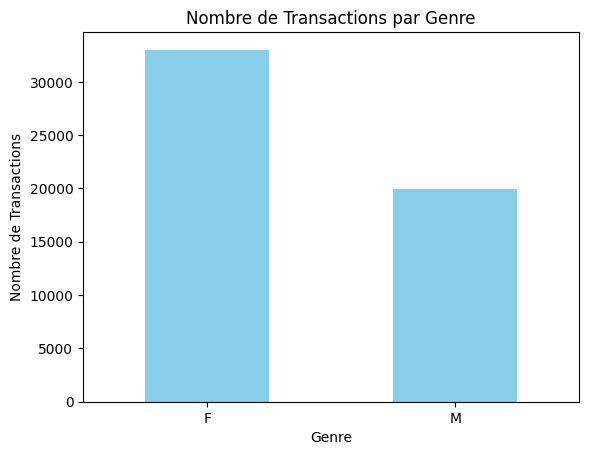

In [ ]:
# On regroupe les données par genre et on compte les occurrences
gender_counts = df1.groupby('Gender').size()

# Création d'un graphique à barres pour visualiser le nombre de transactions par genre

gender_counts.plot(kind='bar', color='skyblue')
plt.title('Nombre de Transactions par Genre')
plt.xlabel('Genre')
plt.ylabel('Nombre de Transactions')
plt.xticks(rotation=0)
plt.show()


Commentaires : 

Le graphique montre le "Nombre de Transactions par Genre", avec deux barres représentant les genres féminin (F) et masculin (M).


- Observations Directes :

- **Transactions Féminines Dominent** : La barre représentant les femmes (F) est nettement plus haute que celle des hommes (M), indiquant que les femmes ont réalisé plus de transactions que les hommes dans cet ensemble de données.

- **Proportions** : On peut observer que les femmes ont effectué environ 50% de transactions de plus que les hommes, si l'on se base sur les proportions visuelles approximatives des barres.

- Interprétations et Implications :

1. **Comportement d'Achat** :

   - Ce résultat indique que les femmes sont soit plus actives dans leur utilisation de ce service ou produit, soit que les offres sont plus attrayantes pour les femmes que pour les hommes.
   - Il est également à prendre en compte que la base de clientèle inclut plus de femmes que d'hommes.

2. **Marketing Ciblé** :

   - Les entreprises peuvent considérer ces informations pour cibler davantage les campagnes marketing vers les femmes, puisqu'elles représentent une part plus importante des transactions.
   - Des analyses supplémentaires pourraient déterminer si certaines promotions, produits ou services sont particulièrement populaires parmi les femmes, permettant des ajustements de l'offre pour mieux répondre à cette demande.

3. **Amélioration des Services ou Produits pour les Hommes** :

   - Les entreprises pourraient également explorer pourquoi les hommes participent moins en nombre de transactions. Cela pourrait conduire à des ajustements dans les stratégies de produit ou de communication pour augmenter l'engagement masculin.

4. **Analyse Démographique** :

   - Une segmentation plus profonde des données pourrait révéler des tendances plus nuancées, telles que les préférences de produits spécifiques ou les habitudes de dépenses dans les deux groupes de genre.

5. **Planification de Stock et Logistique** :

   - Si cette tendance est constante sur différents produits ou services, la planification des stocks et la logistique peuvent être optimisées en fonction du volume de transactions par genre.

- Conclusion

Ce graphique fournit un aperçu clair de la répartition des transactions par genre, offrant des insights précieux pour des décisions stratégiques en marketing, en gestion de produit, et en planification commerciale. Il met en évidence l'importance de comprendre les comportements d'achat des différents segments de clients pour optimiser les approches de marché.

- b) Montant Moyen Dépensé en Ligne par Mois

Analyse : Montant moyen dépensé en ligne par mois.

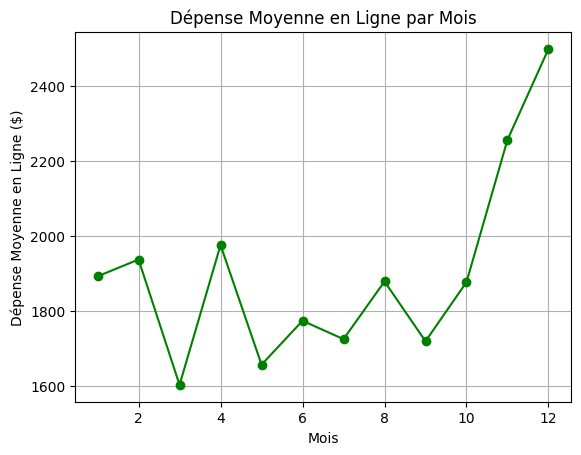

In [ ]:
#  la colonne 'Month' est de type datetime pour permettre l'analyse
df1['Month'] = pd.to_datetime(df1['Transaction_Date']).dt.month

# Calcul du montant moyen dépensé en ligne par mois
monthly_online_spend = df1.groupby('Month')['Online_Spend'].mean()

# Visualisation
monthly_online_spend.plot(kind='line', marker='o', linestyle='-', color='green')
plt.title('Dépense Moyenne en Ligne par Mois')
plt.xlabel('Mois')
plt.ylabel('Dépense Moyenne en Ligne ($)')
plt.grid(True)
plt.show()


Commentaires :

Le graphique montre l'évolution de la dépense moyenne en ligne par mois au cours de l'année. 

- Observations :

1. **Variabilité Mensuelle** :

   - La dépense moyenne en ligne varie considérablement d'un mois à l'autre. Les points les plus bas sont observés autour des mois de juin (6) et septembre (9), tandis que les dépenses augmentent de manière significative vers la fin de l'année, en décembre (12).

2. **Pic de Dépense en Décembre** :

   - Un pic notable est observé en décembre, où les dépenses moyennes augmentent abruptement pour atteindre le niveau le plus élevé de l'année.

3. **Creux au Milieu de l'Année** :

   - Il y a un creux notable dans les dépenses en ligne autour de juin et septembre, suggérant une baisse des activités de shopping en ligne durant ces mois.

- Interprétation :

- **Effet Saisonnier** :

  - Les variations pourraient refléter un effet saisonnier typique dans les habitudes de consommation. Par exemple, l'augmentation en décembre peut être attribuée aux achats des fêtes de fin d'année. Cette tendance est courante dans de nombreux secteurs de vente au détail où les consommateurs augmentent leurs dépenses pour les cadeaux de Noël et les promotions de fin d'année.
  
- **Baisse en Été** :

  - La baisse des dépenses en juin et septembre pourrait correspondre à des périodes où les consommateurs sont traditionnellement moins enclins à faire des achats importants, peut-être en raison des vacances d'été ou de la rentrée scolaire, périodes pendant lesquelles les dépenses pourraient se déplacer vers d'autres catégories non capturées par les achats en ligne typiques.

- **Stratégies Marketing** :

  - Les entreprises pourraient utiliser ces informations pour planifier des campagnes de marketing ciblées pour stimuler les ventes durant les creux observés. Par exemple, des promotions spéciales ou des réductions pourraient être offertes en juin et en septembre pour augmenter les dépenses en ligne.

- **Planification des Stocks et des Ressources** :

  - Cette analyse peut aider les entreprises à planifier mieux leurs stocks et leurs ressources en prévision des périodes de forte demande, en particulier en approchant de décembre. Avoir suffisamment de stock et optimiser la logistique durant cette période peut éviter les ruptures de stock et maximiser les profits.

- Conclusion :

Cette visualisation fournit des insights précieux sur les tendances mensuelles des dépenses en ligne, qui peuvent aider les entreprises à prendre des décisions éclairées concernant la gestion des stocks, la planification des campagnes promotionnelles, et l'allocation des ressources marketing pour capitaliser sur les périodes de haute activité et contrer les périodes de faible activité.

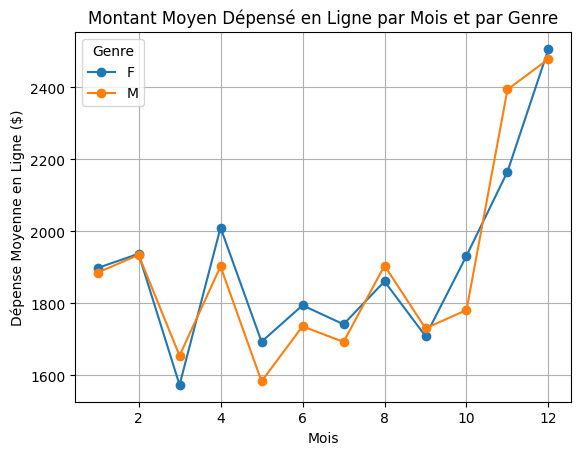

In [ ]:
# la date est au format datetime 
df1['Month'] = pd.to_datetime(df1['Transaction_Date']).dt.month

# Groupement par mois et genre, puis calcul de la moyenne des dépenses en ligne
monthly_gender_online_spend = df1.groupby(['Month', 'Gender'])['Online_Spend'].mean().unstack()

# Visualisation avec un graphique à lignes
monthly_gender_online_spend.plot(kind='line', marker='o')
plt.title('Montant Moyen Dépensé en Ligne par Mois et par Genre')
plt.xlabel('Mois')
plt.ylabel('Dépense Moyenne en Ligne ($)')
plt.grid(True)
plt.legend(title='Genre')
plt.show()


Commentaires :

Le graphique "Montant Moyen Dépensé en Ligne par Mois et par Genre" montre la dépense moyenne en ligne pour les femmes (F) et les hommes (M) au fil des mois, de février à décembre.

- Analyse Générale :

1. **Trajectoire des Dépenses** :

   - Pour les deux genres, on observe une tendance générale à l'augmentation des dépenses au fil de l'année, culminant en décembre, probablement en raison des achats de fin d'année.

2. **Comparaison par Genre** :

   - Les femmes dépensent constamment plus que les hommes chaque mois, à l'exception des mois de juin et septembre où les dépenses des hommes surpassent légèrement ou égalisent celles des femmes.

3. **Variations Mensuelles** :

   - Il y a des fluctuations dans les dépenses pour les deux genres, avec des baisses notables en juin et septembre. Ces mois pourraient correspondre à des périodes de dépenses traditionnellement plus faibles ou à des événements saisonniers spécifiques qui affectent les habitudes d'achat.

- Interprétations Détaillées :

- **Saison haute en décembre** :

  - Les dépenses augmentent significativement en décembre pour les deux genres, ce qui est typique du comportement des consommateurs pendant la période des fêtes.
  
- **Été et automne** :

  - Les mois d'été et de début d'automne montrent une volatilité dans les dépenses, avec une tendance à la baisse en juin et septembre qui peut être liée aux vacances d'été et à la rentrée scolaire, où les dépenses pourraient se déplacer vers des catégories non représentées ici.
  
- **Différences entre genres** :

  - Les femmes dépensant plus que les hommes pourrait indiquer que les produits ou services offerts en ligne sont plus attrayants pour les femmes ou que les femmes sont plus enclines à dépenser pour des achats en ligne que les hommes dans ce segment de marché.

- Implications Stratégiques :

- **Ciblage Marketing** :

  - Les entreprises peuvent utiliser ces informations pour cibler spécifiquement des promotions et des publicités en ligne pendant les mois de forte dépense et ajuster les stratégies pour stimuler les ventes pendant les creux observés en été et en automne.
  
- **Ajustements de Stock** :

  - Planifier les niveaux de stock en anticipation des pics de consommation en décembre et adapter les offres en fonction des préférences de genre pourrait améliorer l'efficacité des ventes.
  
- **Personnalisation par Genre** :

  - Développer des stratégies de marketing personnalisées qui prennent en compte les différences de comportement d'achat entre les hommes et les femmes tout au long de l'année.

- Conclusion

Ce graphique révèle des insights précieux sur le comportement des consommateurs en ligne en fonction du mois et du genre, fournissant une base pour des décisions de marketing et de gestion de stock stratégiques. Les entreprises peuvent utiliser ces données pour optimiser leurs campagnes et leur gestion des inventaires, s'assurant ainsi qu'elles répondent efficacement aux tendances de consommation tout au long de l'année.

- c) Analyse de la Quantité de Produit Vendue par Catégorie de Produit

Analyse : Quantité totale de produits vendus, groupée par catégorie de produit.

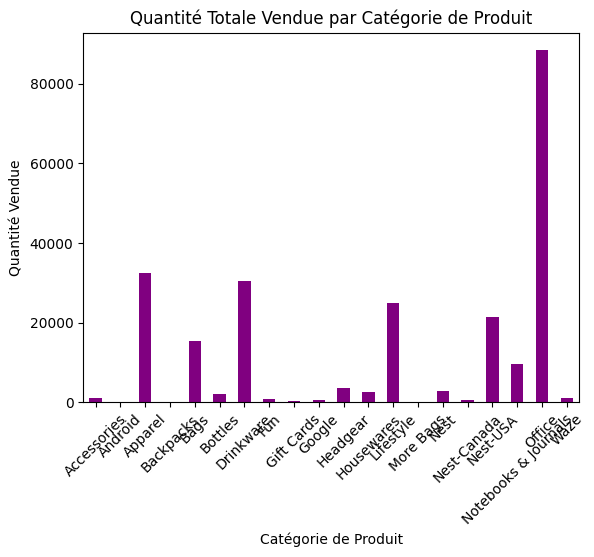

In [ ]:
# Groupement par catégorie de produit et somme des quantités
category_quantity = df1.groupby('Product_Category')['Quantity'].sum()

# Visualisation en diagramme à barres
category_quantity.plot(kind='bar', color='purple')
plt.title('Quantité Totale Vendue par Catégorie de Produit')
plt.xlabel('Catégorie de Produit')
plt.ylabel('Quantité Vendue')
plt.xticks(rotation=45)  # Rotation for better readability
plt.show()


Commentaires :

Le graphique "Quantité Totale Vendue par Catégorie de Produit" illustre la distribution des quantités vendues pour diverses catégories de produits. Voici une interprétation des données visuelles :

- Observations Clés

- **Catégorie Dominante** : La catégorie "Notebooks & Office Size" domine nettement en termes de quantité vendue, avec un volume beaucoup plus élevé que les autres catégories.

- **Autres Catégories Notables** : Les catégories "Apparel" et "Drinkware" montrent également des volumes de vente significatifs, bien que nettement inférieurs à celui des notebooks.

- **Faible Volume de Vente** : Plusieurs catégories comme "Accessories", "Backpacks", "Gift Cards", "Houseware", et "Nest - Cameras & Security" ont des volumes de vente relativement faibles.

- Interprétations et Implications

1. **Priorité de Stock et de Marketing** :

   - **Focus sur les Notebooks** : L'énorme volume de ventes dans la catégorie "Notebooks & Office Size" suggère une forte demande pour ces produits. Les entreprises pourraient prioriser le stock et les campagnes marketing autour de ces articles pour capitaliser sur leur popularité.

   - **Attention aux Catégories Populaires** : Bien que moins dominantes, les catégories "Apparel" et "Drinkware" montrent une popularité qui mérite également une attention stratégique en termes de stock et de promotion.

2. **Analyse de la Demande Consommateur** :

   - La répartition montre les préférences des consommateurs et les tendances d'achat dans différentes catégories, ce qui peut aider les entreprises à adapter leurs stratégies de produit et de marketing pour répondre à ces tendances.

3. **Stratégies de Diversification** :

   - Pour les catégories avec des volumes de vente plus faibles, une analyse plus profonde pourrait être nécessaire pour comprendre les causes de ces faibles performances. Cela pourrait inclure des facteurs tels que le prix, la qualité des produits, ou le manque de visibilité dans les canaux de vente.

4. **Planification des Promotions et Remises** :

   - Des promotions ciblées ou des remises pourraient être envisagées pour stimuler les ventes dans les catégories sous-performantes, particulièrement si ces produits sont stratégiques pour l'entreprise.

5. **Réévaluation de la Gamme de Produits** :

   - L'entreprise pourrait envisager de réévaluer sa gamme de produits, en augmentant la diversité dans les catégories très performantes et en réduisant ou modifiant l'offre dans les catégories moins performantes.

- Conclusion

Ce graphique fournit des insights précieux pour la prise de décision en matière de gestion des stocks, de planification marketing, et de stratégie produit. Comprendre quelle catégorie de produits attire le plus les consommateurs peut aider à aligner les ressources de l'entreprise avec les opportunités de marché les plus prometteuses.

Pour identifier et visualiser les 5 meilleurs produits vendus par trimestre sur toute l'année à partir de votre DataFrame, nous utiliserons des fonctions de regroupement (groupby), de tri (nlargest) et de transformation des données. Voici comment vous pouvez procéder en utilisant Python et pandas :

Étape 1: Préparation des Données

Tout d'abord, assurez-vous que la colonne Transaction_Date est au format de date approprié et que la colonne Quarter est bien définie.

In [ ]:
# Création de la colonne 'Quarter' à partir de 'Transaction_Date'
df1['Quarter'] = df1['Transaction_Date'].dt.to_period('Q')


Étape 2: 

Calcul des Ventes Totales par Produit et Trimestre

Ensuite, calculez les ventes totales pour chaque produit par trimestre :

In [ ]:
# Groupement par produit et trimestre, puis somme des quantités
total_sales = df1.groupby(['Product_Category', 'Quarter'])['Quantity'].sum().reset_index()

Étape 3: Sélection des 5 Meilleurs Produits par Trimestre

Pour chaque trimestre, sélectionnez les 5 produits ayant les plus grandes quantités vendues :

In [ ]:
def top_n_products(data, n=5):
    return data.nlargest(n, 'Quantity')

# Appliquez la fonction pour obtenir les 5 meilleurs produits par trimestre
top_products_by_quarter = total_sales.groupby('Quarter').apply(top_n_products).reset_index(drop=True)


C:\Users\youmn\AppData\Local\Temp\ipykernel_53252\3952659915.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  top_products_by_quarter = total_sales.groupby('Quarter').apply(top_n_products).reset_index(drop=True)


Étape 4: Visualisation des Résultats

Visualisation des résultats pour mieux comprendre quel produit performe le mieux chaque trimestre :

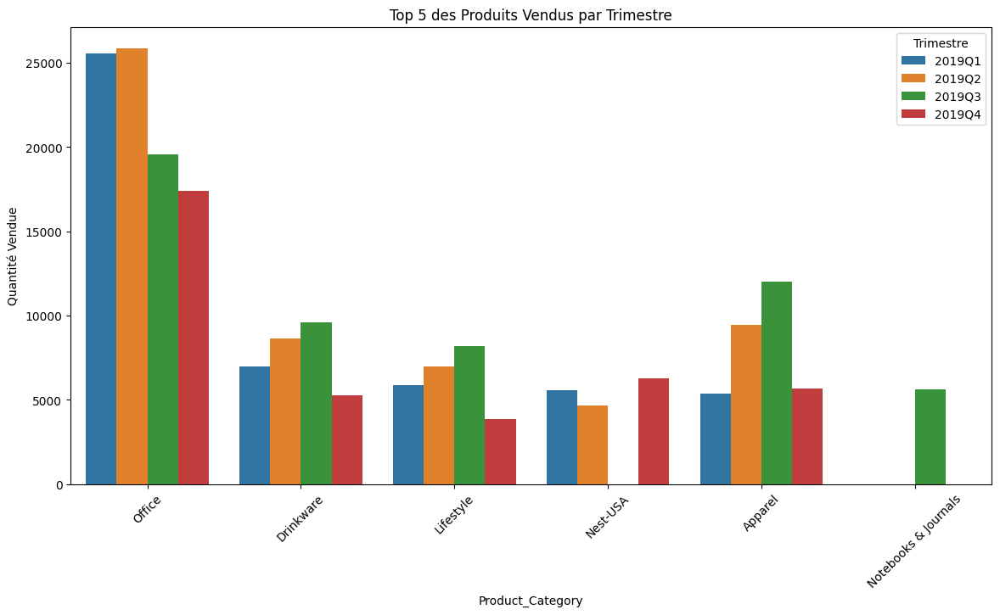

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Visualisation des 5 meilleurs produits par trimestre avec un bar plot
plt.figure(figsize=(14, 7))
sns.barplot(data=top_products_by_quarter, x='Product_Category', y='Quantity', hue='Quarter')
plt.title('Top 5 des Produits Vendus par Trimestre')
plt.xlabel('Product_Category')
plt.ylabel('Quantité Vendue')
plt.xticks(rotation=45)
plt.legend(title='Trimestre')
plt.show()


Commentaires :

Le graphique "Top 5 des Produits Vendus par Trimestre" présente les ventes de cinq catégories de produits sur quatre trimestres de l'année 2019. Les catégories incluent Office, Drinkware, Lifestyle, Nest USA, et Apparel. 


- Analyse des Tendances Trimestrielles

1. **Catégorie 'Office'** :

   - Dominante tout au long de l'année, la catégorie 'Office' montre une forte présence en termes de quantités vendues, avec un léger déclin au fil des trimestres. Ce pourrait être dû à un pic de renouvellement ou d'acquisitions de fournitures de bureau en début d'année, suivi d'une normalisation des achats.

2. **Catégorie 'Drinkware'** :

   - Les ventes dans cette catégorie fluctuent mais montrent une tendance à la baisse au cours de l'année. Un pic est observé au deuxième trimestre, peut-être en lien avec des campagnes promotionnelles saisonnières ou des événements spéciaux (par exemple, la Fête des Mères, des événements sportifs d'été).

3. **Catégorie 'Lifestyle'** :

   - Les ventes semblent être relativement stables avec une légère augmentation au quatrième trimestre, ce qui pourrait coïncider avec les achats des fêtes de fin d'année où les consommateurs cherchent à renouveler leur garde-robe ou à acheter des cadeaux.

4. **Catégorie 'Nest USA'** :

   - Présente une volatilité notable avec une pointe au troisième trimestre. Cela pourrait indiquer une réponse à une campagne marketing spécifique ou à des sorties de nouveaux produits qui attirent l'attention des consommateurs pendant cette période.

5. **Catégorie 'Apparel'** :

   - Connaît une croissance considérable au quatrième trimestre, probablement en raison des achats de vêtements d'hiver ou des cadeaux de Noël, suivant une tendance de consommation typique dans le secteur de la mode.

- Implications Stratégiques

- **Planification des Stocks** :

  - Les entreprises pourraient utiliser ces données pour ajuster leurs niveaux de stock avant les périodes de forte demande, en particulier dans les catégories 'Office' et 'Apparel' qui montrent des pics spécifiques au cours de l'année.

- **Campagnes Marketing Ciblées** :

  - Adapter les campagnes marketing pour capitaliser sur les tendances saisonnières peut augmenter les ventes. Par exemple, renforcer les promotions pour 'Drinkware' au deuxième trimestre et pour 'Apparel' au quatrième trimestre.

- **Optimisation des Prix** :

  - Évaluer les stratégies de tarification peut aider à stimuler les ventes pendant les périodes creuses, en particulier pour les catégories qui montrent des baisses, comme 'Drinkware' dans les troisièmes et quatrièmes trimestres.

- Conclusion

Ce graphique offre une vue précieuse de la dynamique des ventes par produit et par trimestre, permettant aux entreprises de comprendre mieux les cycles de vente et d'adapter leurs stratégies en conséquence. La connaissance de ces tendances aide non seulement à maximiser les revenus mais aussi à optimiser les opérations et le marketing pour aligner l'offre avec la demande du marché.

In [ ]:
df1.tail(10)

,Unnamed: 0,CustomerID,Gender,Location,Tenure_Months,Transaction_ID,Transaction_Date,Product_SKU,Product_Description,Product_Category,...,Delivery_Charges,Coupon_Status,GST,Date,Offline_Spend,Online_Spend,Month,Coupon_Code,Discount_pct,Quarter
52914,52914,14031.0,F,Chicago,17.0,19075.0,2019-01-29,GGOEGBPB081999,UpCycled Bike Saddle Bag,Accessories,...,6.5,Clicked,0.10,2019-01-29,700.0,836.13,1,ACC10,10.0,2019Q1
52915,52915,15002.0,M,Chicago,41.0,23797.0,2019-03-22,GGOEGGCX056299,Gift Card - $25.00,Gift Cards,...,0.0,Clicked,0.05,2019-03-22,2000.0,2523.41,3,GC30,30.0,2019Q1
52916,52916,15002.0,M,Chicago,41.0,23798.0,2019-03-22,GGOEGGCX056299,Gift Card - $25.00,Gift Cards,...,0.0,Used,0.05,2019-03-22,2000.0,2523.41,3,GC30,30.0,2019Q1
52917,52917,15002.0,M,Chicago,41.0,23799.0,2019-03-22,GGOEGGCX056299,Gift Card - $25.00,Gift Cards,...,0.0,Clicked,0.05,2019-03-22,2000.0,2523.41,3,GC30,30.0,2019Q1
52918,52918,15002.0,M,Chicago,41.0,23800.0,2019-03-22,GGOEGGCX056299,Gift Card - $25.00,Gift Cards,...,0.0,Clicked,0.05,2019-03-22,2000.0,2523.41,3,GC30,30.0,2019Q1
52919,52919,13155.0,F,California,8.0,22504.0,2019-03-10,GGOEGGCX056399,Gift Card - $250.00,Gift Cards,...,0.0,Clicked,0.05,2019-03-10,2500.0,1294.22,3,GC30,30.0,2019Q1
52920,52920,18077.0,M,Chicago,34.0,24250.0,2019-03-28,GGOEGGCX056299,Gift Card - $25.00,Gift Cards,...,0.0,Used,0.05,2019-03-28,2000.0,1066.12,3,GC30,30.0,2019Q1
52921,52921,16085.0,M,California,15.0,39991.0,2019-10-06,GGOEGOCD078399,Google Leather Perforated Journal,Notebooks & Journals,...,6.0,Clicked,0.05,2019-10-06,3000.0,2230.76,10,NJ10,10.0,2019Q4
52922,52922,16085.0,M,California,15.0,39991.0,2019-10-06,GGOEGOCR078499,Google Spiral Leather Journal,Notebooks & Journals,...,6.0,Used,0.05,2019-10-06,3000.0,2230.76,10,NJ10,10.0,2019Q4
52923,52923,13659.0,F,Chicago,8.0,39998.0,2019-10-06,GGOEGOCC077999,Google Spiral Journal with Pen,Notebooks & Journals,...,6.5,Not Used,0.05,2019-10-06,3000.0,2230.76,10,NJ10,10.0,2019Q4


- d) analyser le fait que les coupons soient utilisés et si cela influence l'achat ?

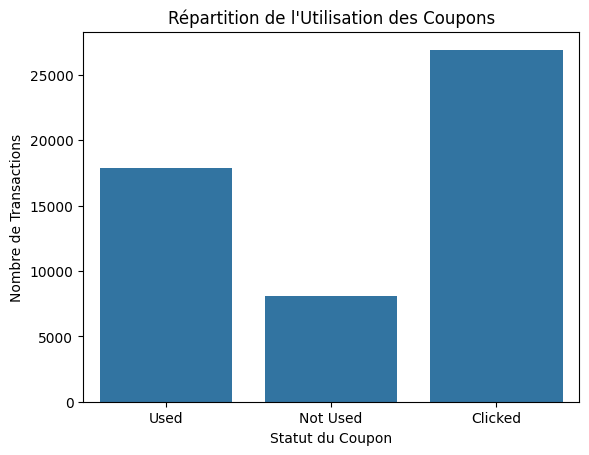

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Répartition de l'utilisation des coupons
sns.countplot(x='Coupon_Status', data=df1)
plt.title('Répartition de l\'Utilisation des Coupons')
plt.xlabel('Statut du Coupon')
plt.ylabel('Nombre de Transactions')
plt.show()


Commentaires :

Le graphique "Répartition de l'Utilisation des Coupons" illustre le nombre de transactions classées en trois catégories basées sur le statut des coupons : "Used" (Utilisés), "Not Used" (Non utilisés), et "Clicked" (Cliqués).

- Observations du Graphique

1. **Coupons Cliqués** :
   - La catégorie "Clicked" présente le nombre le plus élevé de transactions, suggérant que beaucoup de clients cliquent sur les offres de coupons.
   
2. **Coupons Utilisés** :
   - La catégorie "Used" montre un nombre substantiel de transactions où les coupons ont effectivement été utilisés pour réaliser un achat. Cela indique un taux de conversion positif de l'intérêt vers l'action d'achat réelle.

3. **Coupons Non Utilisés** :
   - La catégorie "Not Used" indique le nombre de fois où les coupons, bien que disponibles ou connus de l'acheteur, n'ont pas été utilisés pour finaliser une transaction.

- Analyse et Implications

- **Taux de Conversion** :

  - La différence entre les coupons "Clicked" et "Used" montre le taux de conversion des interactions en achats réels. Bien que beaucoup cliquent sur les coupons, une proportion plus faible les utilise effectivement pour faire des achats. Cela pourrait indiquer soit un manque d'attrait de l'offre finale, soit des restrictions ou conditions associées aux coupons qui dissuadent les achats.

- **Influence sur les Décisions d'Achat** :

  - Les coupons semblent avoir une influence significative sur les décisions d'achat, comme le montre le nombre élevé de coupons utilisés. Cela suggère que les offres promotionnelles sont efficaces pour encourager les achats. Pour ceux qui cliquent mais n'utilisent pas le coupon, il peut y avoir des barrières, comme des conditions d'utilisation complexes ou peu attrayantes, qui pourraient être améliorées.

- **Stratégies Marketing** :

  - **Optimisation des Offres** : Analyser les raisons pour lesquelles les coupons ne sont pas utilisés malgré un intérêt initial pourrait aider à ajuster les termes des offres ou à simplifier le processus d'utilisation des coupons.
  - **Ciblage et Personnalisation** : Renforcer les efforts pour cibler les offres de coupons aux segments de clients les plus susceptibles de les utiliser basé sur des analyses de données antérieures pourrait améliorer le taux d'utilisation.
  
- **Suivi et Analyse** :

  - Suivre les tendances au fil du temps peut aider à comprendre si les changements dans les stratégies de couponing ont un impact positif sur l'utilisation réelle des coupons. L'utilisation accrue des coupons pourrait être un indicateur de campagnes plus efficaces ou d'une meilleure correspondance entre les offres et les préférences des clients.

- Conclusion

Les coupons influencent clairement les achats, avec un taux de conversion notable mais perfectible des interactions (clics) en transactions réelles. Optimiser les offres, simplifier les conditions d'utilisation, et cibler efficacement les promotions peut améliorer l'utilisation des coupons et, par conséquent, augmenter les ventes globales.

1. Visualisation de l'Impact des Coupons sur les Dépenses en Ligne et Hors Ligne
Nous allons créer des graphiques pour comparer les dépenses en ligne et hors ligne avec et sans l'utilisation de coupons :

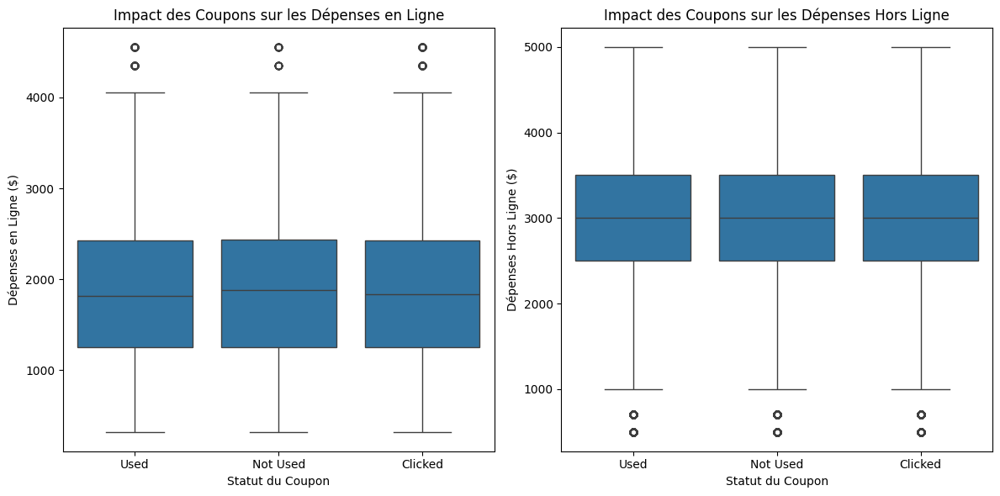

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot pour comparer les dépenses en ligne avec et sans coupon
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)  # 1 row, 2 columns, 1st subplot
sns.boxplot(x='Coupon_Status', y='Online_Spend', data=df1)
plt.title('Impact des Coupons sur les Dépenses en Ligne')
plt.xlabel('Statut du Coupon')
plt.ylabel('Dépenses en Ligne ($)')

# Boxplot pour comparer les dépenses hors ligne avec et sans coupon
plt.subplot(1, 2, 2)  # 1 row, 2 columns, 2nd subplot
sns.boxplot(x='Coupon_Status', y='Offline_Spend', data=df1)
plt.title('Impact des Coupons sur les Dépenses Hors Ligne')
plt.xlabel('Statut du Coupon')
plt.ylabel('Dépenses Hors Ligne ($)')

plt.tight_layout()
plt.show()


Les deux graphiques présentés montrent l'impact des coupons sur les dépenses en ligne et hors ligne selon le statut du coupon (Utilisé, Non utilisé, Cliqué).

- Interprétation des Boxplots pour les Dépenses en Ligne :

1. **Used (Utilisé)** : Les transactions où les coupons ont été utilisés montrent une médiane des dépenses en ligne légèrement supérieure comparée à celle des autres catégories. Ceci indique que lorsque les coupons sont utilisés, les clients tendent à dépenser plus en ligne.
   
2. **Not Used (Non utilisé)** : La médiane des dépenses pour cette catégorie est légèrement inférieure à celle des coupons utilisés, suggérant que l'absence d'utilisation de coupon n'incite pas à des dépenses plus élevées.

3. **Clicked (Cliqué)** : Cette catégorie montre une médiane des dépenses similaire à celle des coupons non utilisés, mais avec une variabilité plus grande comme le montrent les plus longs whiskers et outliers, indiquant des dépenses occasionnellement très élevées ou très basses.

- Interprétation des Boxplots pour les Dépenses Hors Ligne :

1. **Used (Utilisé)** : Pour les dépenses hors ligne, les transactions avec coupons utilisés montrent une médiane de dépenses plus élevée que pour les autres catégories, ce qui est cohérent avec les observations en ligne. Cela suggère que l'utilisation des coupons peut également encourager des dépenses accrues hors ligne.

2. **Not Used (Non utilisé)** et **Clicked (Cliqué)** : Ces catégories montrent des médianes assez similaires, mais avec des étendues de valeurs (illustrées par les quartiles et les whiskers) plus resserrées pour les coupons non utilisés. Cela pourrait indiquer que les clients qui ne finalisent pas l'utilisation de coupons maintiennent un niveau de dépense plus prévisible et modéré.

- Conclusions Globales et Stratégiques :

- **Impact des Coupons** : L'utilisation effective des coupons est associée à des dépenses accrues tant en ligne qu'hors ligne, ce qui confirme l'efficacité des coupons comme outil de stimulation des ventes.

- **Engagement Client** : Le fait que les dépenses des clients soient plus élevées lorsqu'ils utilisent des coupons suggère que ces offres réussissent à engager les clients pour qu'ils dépensent plus, ce qui est un indicateur positif pour les stratégies de marketing basées sur les coupons.

- **Variabilité des Dépenses** : La plus grande variabilité dans la catégorie "Clicked" peut indiquer un segment de clients qui explore les offres sans engagement constant, ce qui peut représenter une opportunité de ciblage pour convertir l'intérêt en ventes réelles.

- **Optimisation des Promotions** : Ces insights peuvent être utilisés pour affiner davantage les campagnes promotionnelles, en se concentrant sur la maximisation de l'utilisation effective des coupons, particulièrement en périodes de forte concurrence ou lors d'événements commerciaux clés comme les fêtes de fin d'année.

Ces observations fournissent des directives claires pour améliorer l'efficacité des campagnes de coupons et optimiser les stratégies marketing pour booster les dépenses des clients.

2. Analyse Temporelle de l'Utilisation des Coupons avec Dépenses en Ligne et Hors Ligne

Nous pouvons également examiner comment l'utilisation des coupons varie par mois pour les dépenses en ligne et hors ligne :

<Figure size 1400x700 with 0 Axes>

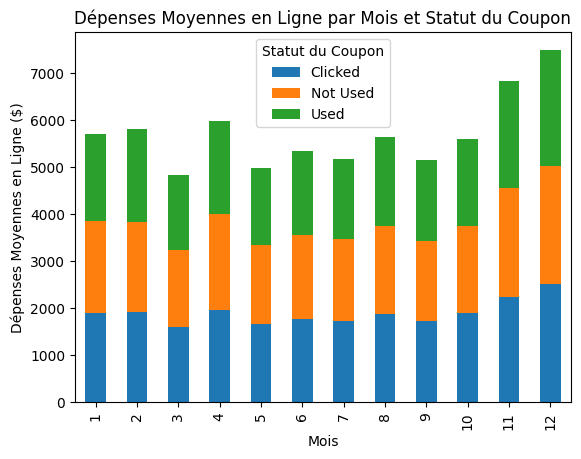

<Figure size 1400x700 with 0 Axes>

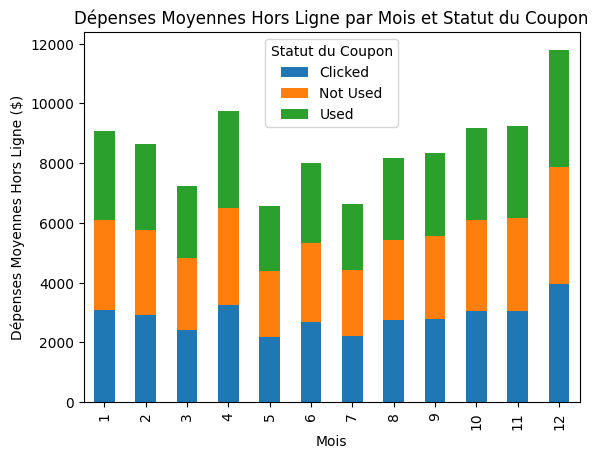

In [ ]:
# Groupement des données par mois et statut du coupon, calcul de la moyenne des dépenses
monthly_online_coupons = df1.groupby(['Month', 'Coupon_Status'])['Online_Spend'].mean().unstack()
monthly_offline_coupons = df1.groupby(['Month', 'Coupon_Status'])['Offline_Spend'].mean().unstack()

# Visualisation des dépenses en ligne par mois
plt.figure(figsize=(14, 7))
monthly_online_coupons.plot(kind='bar', stacked=True)
plt.title('Dépenses Moyennes en Ligne par Mois et Statut du Coupon')
plt.xlabel('Mois')
plt.ylabel('Dépenses Moyennes en Ligne ($)')
plt.legend(title='Statut du Coupon')

# Visualisation des dépenses hors ligne par mois
plt.figure(figsize=(14, 7))
monthly_offline_coupons.plot(kind='bar', stacked=True)
plt.title('Dépenses Moyennes Hors Ligne par Mois et Statut du Coupon')
plt.xlabel('Mois')
plt.ylabel('Dépenses Moyennes Hors Ligne ($)')
plt.legend(title='Statut du Coupon')

plt.show()


Commentaires :

Le graphique "Dépenses Moyennes en Ligne par Mois et Statut du Coupon" illustre comment les dépenses moyennes varient chaque mois en fonction de l'utilisation des coupons, catégorisés comme "Used" (Utilisés), "Not Used" (Non utilisés) et "Clicked" (Cliqués). 

- Analyse des Tendances Mensuelles et des Statuts des Coupons

1. **Dépenses Moyennes par Statut de Coupon** :

   - **Coupons Utilisés (Used)** : La catégorie verte montre généralement les dépenses moyennes les plus élevées chaque mois, indiquant que lorsque les coupons sont utilisés, ils tendent à encourager des dépenses plus importantes. Ce phénomène est particulièrement marqué en fin d'année, notamment en novembre et décembre, probablement en raison des promotions liées aux fêtes de fin d'année.
   
2. **Coupons Cliqués mais Non Utilisés (Clicked)** :

   - La catégorie bleue représente les dépenses pour les clients qui ont cliqué sur les coupons mais ne les ont finalement pas utilisés. Bien que ces dépenses soient généralement inférieures à celles des coupons utilisés, elles surpassent souvent les dépenses où les coupons n'ont pas été utilisés du tout, ce qui peut indiquer que même l'intérêt pour un coupon peut influencer légèrement les habitudes de dépenses.

3. **Coupons Non Utilisés (Not Used)** :

   - La catégorie orange, représentant les occasions où les coupons n'ont pas été utilisés, montre les dépenses les moins élevées pour la majorité des mois. Ce constat peut refléter une tendance des consommateurs à dépenser moins lorsqu'ils n'ont pas l'incitation d'une réduction.

- Implications et Stratégies

- **Effet Incitatif des Coupons** :

  - L'utilisation effective des coupons est clairement liée à une augmentation des dépenses en ligne, ce qui souligne l'efficacité des coupons comme outil marketing pour augmenter les revenus. Les entreprises devraient continuer à optimiser et à cibler les offres de coupons pour maximiser cet effet.
  
- **Engagement des Clients** :

  - Les données montrent que même l'intérêt pour les coupons ("Clicked") peut légèrement augmenter les dépenses par rapport à l'absence totale d'utilisation. Les stratégies de marketing devraient donc non seulement encourager l'utilisation des coupons, mais aussi leur recherche et leur examen, car cela semble également favoriser une augmentation des dépenses.
  
- **Optimisation des Campagnes de Coupons** :

  - La forte hausse des dépenses en fin d'année pour les coupons utilisés suggère que les consommateurs sont particulièrement réceptifs aux promotions pendant cette période. Planifier des campagnes de coupons agressives pendant les mois de haute saison commerciale pourrait être particulièrement rentable.
  
- **Analyse des Comportements de Consommation** :

  - Les variations mensuelles des dépenses avec et sans coupons offrent des insights précieux sur le comportement des consommateurs, qui peuvent être utilisés pour planifier des campagnes tout au long de l'année, ciblant spécifiquement les périodes creuses pour stimuler les ventes.

- Conclusion

En résumé, le graphique met en évidence la corrélation positive entre l'utilisation des coupons et l'augmentation des dépenses en ligne. Cette tendance soutient l'idée que des coupons bien ciblés et conçus pour coïncider avec les intérêts des consommateurs peuvent non seulement augmenter les ventes directes mais aussi renforcer l'engagement des clients avec la marque à travers le processus d'achat en ligne.

Pour ajuster l'analyse des dépenses et visualiser l'évolution mensuelle au lieu de l'analyse annuelle, nous devons modifier légèrement le traitement des données pour inclure les détails mensuels. 

Étape 1: Préparation des Données

D'abord, on prépare nos données en créant une colonne Month-Year qui combine les informations du mois et de l'année pour un suivi plus précis sur une base mensuelle.

In [ ]:
# Créer une colonne 'Month-Year' pour les analyses mensuelles
df1['Month-Year'] = df1['Transaction_Date'].dt.to_period('M').astype(str)  # 'M' pour le format mensuel

# Calculer les dépenses totales par ville et par mois-année
monthly_spend_per_city = df1.groupby(['Month-Year', 'Location'])['Online_Spend'].sum().reset_index()


In [ ]:
print(nbformat.__version__)

5.10.4


Étape 2: Création du Graphique en Ligne

Ensuite, utilisez Plotly Express pour créer un graphique en ligne qui affiche les dépenses mensuelles par ville. Ce graphique permettra de voir les variations mensuelles des dépenses.

In [ ]:
# Création d'un graphique en ligne pour visualiser les dépenses mensuelles par ville
fig = px.line(monthly_spend_per_city, x='Month-Year', y='Online_Spend', color='Location',
              title='Évolution des Dépenses en ligne Mensuelles par Ville',
              labels={'Online_Spend': 'Dépenses Totales en ligne ', 'Month-Year': 'Mois', 'Location': 'Ville'})

# Améliorer le graphique avec des options de style
fig.update_layout(xaxis=dict(tickmode='linear', type='category'),
                  yaxis_title='Dépenses Totales en ligne($)',
                  legend_title='Ville')

# Affichage graphique
fig.show()


Commentaires :

Le graphique montre des variations significatives dans les dépenses entre différentes villes. Ces variations pourraient indiquer des différences dans les préférences des consommateurs, le pouvoir d'achat ou la popularité des coupons dans ces régions.


In [ ]:
# On vérifie le type de nos données
df1['Online_Spend'] = pd.to_numeric(df1['Online_Spend'], errors='coerce')
df1['Offline_Spend'] = pd.to_numeric(df1['Offline_Spend'], errors='coerce')

# Agrégation des données par genre
spend_by_gender = df1.groupby('Gender').agg({
    'Online_Spend': 'sum',
    'Offline_Spend': 'sum'
}).reset_index()

# Création d'un graphique à barres empilées avec Plotly Express
fig = px.bar(spend_by_gender, x='Gender', y=['Online_Spend', 'Offline_Spend'],
             title='Dépenses en Ligne vs. Hors Ligne par Genre',
             labels={'value': 'Dépenses Totales ($)', 'variable': 'Type de Dépense'},
             barmode='group')

# Amélioration du graphique avec des options de style
fig.update_layout(xaxis_title='Genre',
                  yaxis_title='Dépenses Totales ($)',
                  legend_title='Type de Dépense')

# Afficher le graphique
fig.show()


In [ ]:
# On vérifie le type de nos données
df1['Online_Spend'] = pd.to_numeric(df1['Online_Spend'], errors='coerce')
df1['Offline_Spend'] = pd.to_numeric(df1['Offline_Spend'], errors='coerce')

# Agrégation des données par genre et ville
spend_by_gender_city = df1.groupby(['Gender', 'Location']).agg({
    'Online_Spend': 'sum',
    'Offline_Spend': 'sum'
}).reset_index()


In [ ]:
# On vérifie le type de nos données
df1['Online_Spend'] = pd.to_numeric(df1['Online_Spend'], errors='coerce')
df1['Offline_Spend'] = pd.to_numeric(df1['Offline_Spend'], errors='coerce')

# Agrégation des données par genre et ville
spend_by_gender_city = df1.groupby(['Gender', 'Location']).agg({
    'Online_Spend': 'sum',
    'Offline_Spend': 'sum'
}).reset_index()

# Préparer les données pour la visualisation
# Nous allons transformer le DataFrame pour avoir une colonne pour le type de dépense
spend_by_gender_city = pd.melt(spend_by_gender_city, id_vars=['Gender', 'Location'], value_vars=['Online_Spend', 'Offline_Spend'],
                               var_name='Type_of_Spend', value_name='Total_Spend')

# Création d'un graphique à barres avec Plotly Express
fig = px.bar(spend_by_gender_city, x='Location', y='Total_Spend', color='Type_of_Spend',
             pattern_shape='Gender', facet_col='Gender', barmode='group',
             title='Dépenses en Ligne vs. Hors Ligne par Genre et Ville',
             labels={'Total_Spend': 'Dépenses Totales ($)', 'Location': 'Ville', 'Type_of_Spend': 'Type de Dépense'})

# Amélioration du graphique avec des options de style
fig.update_layout(xaxis_title='Ville',
                  yaxis_title='Dépenses Totales ($)',
                  legend_title='Type de Dépense',
                  xaxis={'categoryorder':'total descending'})

# Afficher le graphique
fig.show()


In [ ]:
%pip install nbformat


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


# Annexes :

Pour trouver les librairies utilisées ainsi que leur versions :

In [ ]:
import nbformat
import pkg_resources
import re

# Charger le notebook
path_to_notebook = 'C:/Users/youmn/OneDrive/Bureau/FAC/Master 1/Formation/DataViz/projet DataManagement_1.ipynb'
with open(path_to_notebook, 'r', encoding='utf-8') as f:
    notebook = nbformat.read(f, as_version=4)

# Extraire les modules importés dans toutes les cellules
imported_libraries = set()
for cell in notebook.cells:
    if cell.cell_type == 'code':
        source_code = cell.source
        imports = re.findall(r'(?:import|from) (\S+)', source_code)
        for imp in imports:
            # Extraire le nom du module principal seulement
            module_name = imp.split('.')[0]
            imported_libraries.add(module_name)

# Obtenir la version de chaque bibliothèque importée
library_versions = {}
for lib in imported_libraries:
    try:
        # Vérifier si la bibliothèque est installée et obtenir sa version
        dist = pkg_resources.get_distribution(lib)
        library_versions[lib] = dist.version
    except pkg_resources.DistributionNotFound:
        # Si la distribution n'est pas trouvée, ignorer ou signaler comme non trouvée
        library_versions[lib] = "Non trouvée"

print(library_versions)


{'Counter': 'Non trouvée', 'matplotlib': '3.8.2', 'numpy': '1.26.4', 'pandas': '2.2.0', 'pkg_resources': 'Non trouvée', 'plotly': '5.22.0', 'os': 'Non trouvée', 'nbformat': '5.10.4', 'seaborn': '0.13.2', 're': 'Non trouvée', 'collections': 'Non trouvée'}


In [ ]:
import nbformat
import pkg_resources
import re
import sys

# Modules de la bibliothèque standard Python à exclure
standard_libs = {'os', 'sys', 're', 'collections', 'datetime', 'math', 'json', 'logging', 'Counter', 'pkg_resources'}

# Charger le notebook
path_to_notebook = 'C:/Users/youmn/OneDrive/Bureau/FAC/Master 1/Formation/DataViz/projet DataManagement_1.ipynb'
with open(path_to_notebook, 'r', encoding='utf-8') as f:
    notebook = nbformat.read(f, as_version=4)

# Extraire les modules importés dans toutes les cellules
imported_libraries = set()
for cell in notebook.cells:
    if cell.cell_type == 'code':
        source_code = cell.source
        imports = re.findall(r'(?:import|from) (\S+)', source_code)
        for imp in imports:
            # Extraire le nom du module principal seulement
            module_name = imp.split('.')[0]
            if module_name not in standard_libs:
                imported_libraries.add(module_name)

# Obtenir la version de chaque bibliothèque importée
library_versions = {'Python': sys.version}
for lib in imported_libraries:
    try:
        # Vérifier si la bibliothèque est installée et obtenir sa version
        dist = pkg_resources.get_distribution(lib)
        library_versions[lib] = dist.version
    except pkg_resources.DistributionNotFound:
        # Si la distribution n'est pas trouvée, ignorer ou signaler comme non trouvée
        library_versions[lib] = "Non trouvée"

print(library_versions)


{'Python': '3.11.0 (main, Oct 24 2022, 18:26:48) [MSC v.1933 64 bit (AMD64)]', 'matplotlib': '3.8.2', 'numpy': '1.26.4', 'pandas': '2.2.0', 'plotly': '5.22.0', 'nbformat': '5.10.4', 'seaborn': '0.13.2'}


In [ ]:
with open('requirements.txt', 'w') as f:
    for lib, version in library_versions.items():
        f.write(f'{lib}=={version}\n')


In [ ]:
pip freeze > requirements.txt


Note: you may need to restart the kernel to use updated packages.


Exportation du fichier nettoyé

In [ ]:
df_clean = df1

In [ ]:
df_clean.to_csv('C:/Users/youmn/OneDrive/Bureau/FAC/Master 1/Formation/DataViz/file_clean.csv', index=False)

In [ ]:
%pip install streamlit

     ---------------------------------------- 8.6/8.6 MB 7.2 MB/s eta 0:00:00
     -------------------------------------- 857.8/857.8 kB 7.8 MB/s eta 0:00:00
     -------------------------------------- 413.4/413.4 kB 6.5 MB/s eta 0:00:00
     ---------------------------------------- 25.9/25.9 MB 9.1 MB/s eta 0:00:00
     ---------------------------------------- 64.9/64.9 kB 3.6 MB/s eta 0:00:00
     -------------------------------------- 240.7/240.7 kB 7.2 MB/s eta 0:00:00
     ------------------------------------- 207.3/207.3 kB 12.3 MB/s eta 0:00:00
     ---------------------------------------- 6.9/6.9 MB 7.0 MB/s eta 0:00:00
     ---------------------------------------- 83.0/83.0 kB 4.5 MB/s eta 0:00:00
     -------------------------------------- 133.3/133.3 kB 8.2 MB/s eta 0:00:00
     ---------------------------------------- 56.1/56.1 kB 2.9 MB/s eta 0:00:00
     ---------------------------------------- 62.7/62.7 kB 1.1 MB/s eta 0:00:00
     ---------------------------------------


[notice] A new release of pip available: 22.3 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip
